<center>

## DiploDatos: Aprendizaje No Supervisado

## Agrupamiento con el DataSet FIFA21

![Images/FIFA21.jpg](Images/FIFA21.jpg)

### Indice

1. [Inicialización del Entorno](#1.Inicialización_del_Entorno)
2. [Preparación de los Datos](#2.Preparación_de_los_Datos)
3. [Clustering KM](#3.Clustering_con_KMeans)
4. [Clustering MS](#4.Clustering_con_MeanShift)
5. [Clustering KM sin Arqueros](#5.Clustering_con_KMeans_sin_Arqueros)
6. [Clustering MS sin Arqueros](#6.Clustering_con_MeanShift_sin_Arqueros)

7. Sin definir...

## 1.Inicialización_del_Entorno

Empezamos importando algunas herramientas para cargar los datos y manipularlos.

In [1]:
import warnings

warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)

In [2]:
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

In [3]:
from sklearn.cluster import KMeans, MeanShift, AgglomerativeClustering

## 2.Preparación_de_los_Datos

Cargamos los datos bajados de la database de [Kaggle](https://www.kaggle.com/stefanoleone992/fifa-21-complete-player-dataset) como `DataSet/FIFA21.csv`.

In [4]:
df = pd.read_csv('DataSet/FIFA21.csv')

print(f'Dimensiones: {df.shape}')

Dimensiones: (18944, 106)


In [5]:
# Variables Auxiliares.
name = 'short_name'
age = 'age'
country = 'nationality'
club = 'club_name'
league = 'league_name'
position = 'team_position'
overall = 'overall'
potential = 'potential'

description = [name, age, country, club, league, position, overall, potential]

# Variables Adicionales.
player_class = 'Player Class'
position_type = 'Position Type'
cluster_KMeans = 'KMeans'
cluster_MeanShift = 'MeanShift'
cluster_Agglomerative = 'Agglomerative'

In [6]:
skillGroup = ('attacking',
              'defending',
              'goalkeeping',
              'skill',
              'power',
              'movement',
              'mentality')

skillRating = {}

# Veamos las habilidades con las que estamos trabajando...
for g in skillGroup:
    # Inicializamos el grupo de habilidades.
    skillRating[g] = []
    # Iteramos sobre el conjunto de columnas del DF.
    for c in df.columns[40:100]:
        if c.startswith(g):
            # Almacenamos la habilidad en el grupo.
            skillRating[g].append(c)

**Preparamos la base para Clustering...**

Retiramos jugadores con bajo Desempeño Global (`overall`) y consideramos variables de desempeño por habilidad (*skillRating*).

In [7]:
# Conservamos a los jugadores buenos.
minOverall = 70
bestDF = df[(df[overall] > minOverall)]

# Marcamos a los mejores jugadores.
topOverall = 85
bestDF[player_class] = bestDF[overall].apply(lambda o: 'TOP' if o > topOverall else 'Average')

onlySkills = []
for skills in skillRating.values():
    onlySkills += skills

# Sólo con desempeños según habilidades.
skillsDF = bestDF[onlySkills]

print(f'{len(onlySkills)} variables numéricas sobre desempeño según habilidad')

34 variables numéricas sobre desempeño según habilidad


**Limpiando Nulos**

Por alguna extraña razón, la columna `defending_marking` está completamente vacía.
Debido que los valores **NaN** no aportan información para resolver el problema, eliminaremos la variable de nuestro conjunto de datos.

**UPDATE**
Al investigar un poco sobre el asunto, descubrimos que la variable se denomina `defending_awareness` en la última iteración del juego.

In [8]:
# Al parecer hay valores nulos en el DF.
skillsDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4512 entries, 0 to 4511
Data columns (total 34 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   attacking_crossing          4512 non-null   int64  
 1   attacking_finishing         4512 non-null   int64  
 2   attacking_heading_accuracy  4512 non-null   int64  
 3   attacking_short_passing     4512 non-null   int64  
 4   attacking_volleys           4512 non-null   int64  
 5   defending_marking           0 non-null      float64
 6   defending_standing_tackle   4512 non-null   int64  
 7   defending_sliding_tackle    4512 non-null   int64  
 8   goalkeeping_diving          4512 non-null   int64  
 9   goalkeeping_handling        4512 non-null   int64  
 10  goalkeeping_kicking         4512 non-null   int64  
 11  goalkeeping_positioning     4512 non-null   int64  
 12  goalkeeping_reflexes        4512 non-null   int64  
 13  skill_dribbling             4512 

In [9]:
onlySkills.remove('defending_marking')

# Sólo con desempeños según habilidades (no vacías).
skillsDF = bestDF[onlySkills]

print(f'{len(onlySkills)} variables numéricas sobre desempeño según habilidad')

33 variables numéricas sobre desempeño según habilidad


**Simplificando el Análisis**

Hay demasiadas posiciones en el juego como para analizar los agrupamientos obtenidos de forma simple.
Por lo tanto, para facilitar su estudio, vamos a clasificar una posición en base a la zona en el campo donde habitualmente se ubicaría el jugador.

In [10]:
goalkeepers = ['GK']
defenders = ['LCB', 'RCB', 'LB', 'RB', 'CB', 'LWB', 'RWB']
midfielders = ['LM', 'RM', 'CM', 'LCM', 'RCM', 'LDM', 'RDM', 'CDM', 'LAM', 'RAM', 'CAM']
attackers = ['ST', 'LS', 'RS', 'LW', 'RW', 'LF', 'RF', 'CF']

def general_position(position):
    if position in attackers:
        return 'Attacker'
    elif position in midfielders:
        return 'Midfielder'
    elif position in defenders:
        return 'Defender'
    elif position in goalkeepers:
        return 'Goalkeepers'
    else:
        return 'Others'

bestDF[position_type] = bestDF[position].apply(general_position)

# 3.Clustering_con_KMeans

Es necesario definir la cantidad de grupos (`n_clusters`).
Es un hiperparámetro del algoritmo.

In [11]:
# Número de clusters buscados.
n_clust = 4

km = KMeans(n_clusters=n_clust, random_state=123)
km.fit(skillsDF) # Utiliza todas las habilidades: 33 dimensiones.

# Recuperación de las etiquetas.
clusters = km.labels_

print(f'Suma de los cuadrados de las distancias al cluster (Inertia) {km.inertia_}')

Suma de los cuadrados de las distancias al cluster (Inertia) 11098843.28965165


In [12]:
clustersDF = bestDF.copy()
clustersDF[cluster_KMeans] = clusters.astype(str) # Clusters como Variables Categóricas

print(f'KMeans encontró {max(clusters) + 1} clusters (nosotros forzamos la cantidad)')

KMeans encontró 4 clusters (nosotros forzamos la cantidad)


**Elección de la cantidad de grupos**

Una forma de seleccionar la cantidad más adecuada de *clusters* es probar varias cantidades y usar el criterio del codo, *elbow method*, utilizando una medida de ajuste que puede ser **inertia**.

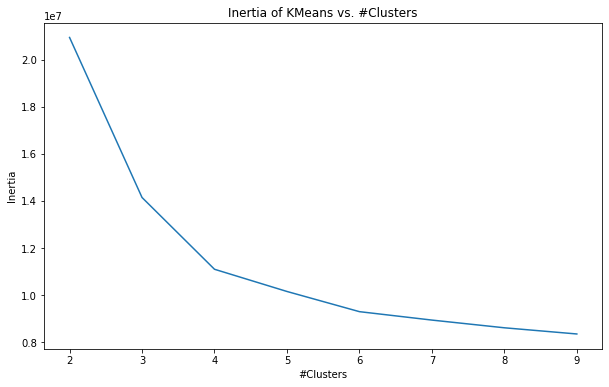

In [13]:
# Prueba para elegir el hiperparámetro 'n_clusters' variando de 2 a 9 clusters.
scores = [KMeans(n_clusters=i).fit(skillsDF).inertia_ for i in range(2, 10)]

plt.figure(figsize=(10, 6))
plt.plot(np.arange(2, 10), scores)
plt.xlabel('#Clusters')
plt.ylabel('Inertia')
plt.title('Inertia of KMeans vs. #Clusters');

**Graficamos agrupamiento de KMedias con la cantidad de clases elegida**

Visualizamos de a dos variables por vez.

In [14]:
# Elegimos dos variables arbitrarias.
skill1 = skillRating['attacking'][1] # attacking_finishing
skill2 = skillRating['defending'][2] # defending_sliding_tackle

In [15]:
fig = px.scatter(clustersDF,
                 x=skill1,
                 y=skill2,
                 color=cluster_KMeans,
                 hover_name=name,
                 hover_data=description,
                 symbol=player_class,
                 symbol_map={'TOP': 'star', 'Average': 'circle'},
                 title='Clustering KMeans',
                 height=800,
                 width=800)

fig.show()

**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los *clusters*, usando las clases asignadas por KMeans**

- Cantidad de observaciones por Cluster.
- Análisis descriptivo separando por Cluster.
- Tabla de contingencia, alguna categórica vs. Clusters.
- Silohuette.

In [16]:
cID = 'Cluster ID'

clustersDF[cluster_KMeans].value_counts()\
                          .reset_index()\
                          .rename(columns={'index': cID, cluster_KMeans: '#Players'})\
                          .set_index(cID)

,#Players
Cluster ID,
1,1681
0,1466
3,921
2,444


**Observación**

- El cluster **0** almacena principalmente jugadores ofensivos.
- El cluster **1** es el más grande, y reune en su mayoría a jugadores del medio campo.
- El cluster **2** es el más pequeño, debido a que agrupa exclusivamente a los arqueros.
- El cluster **3** almacena principalmente jugadores defensivos.

In [17]:
pd.crosstab(clustersDF[cluster_KMeans], clustersDF[position_type])

Position Type,Attacker,Defender,Goalkeepers,Midfielder,Others
KMeans,,,,,
0,478,4,0,364,620
1,23,397,0,607,654
2,0,0,293,0,151
3,0,504,0,64,353


**Observación**

- El cluster **0** no es tan bueno para separar los jugadores ofensivos. Una gran parte de sus elementos corresponden a mediocampistas.
- El cluster **1** no es tan bueno para separar los jugadores del mediocampo. Una gran parte de sus elementos corresponden a defensores.
- El cluster **2** separa a los arqueros del resto de jugadores prácticamente a la perfección. Probablemente sea el agrupamiento más facil de realizar.
- El cluster **3** separa a los jugadores defensivos de forma satisfactoria. Selecciona a algunos mediocampistas, pero es un número relativamente pequeño.

Para n_clusters: 4, el silhouette_score promedio es: 0.30987590385344177
Para n_clusters: 5, el silhouette_score promedio es: 0.2774615620041012
Para n_clusters: 6, el silhouette_score promedio es: 0.23796138780607712


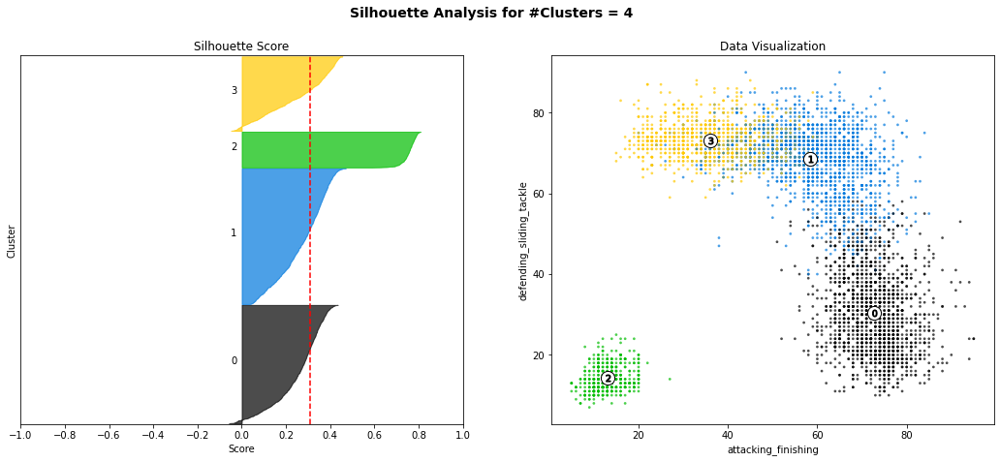

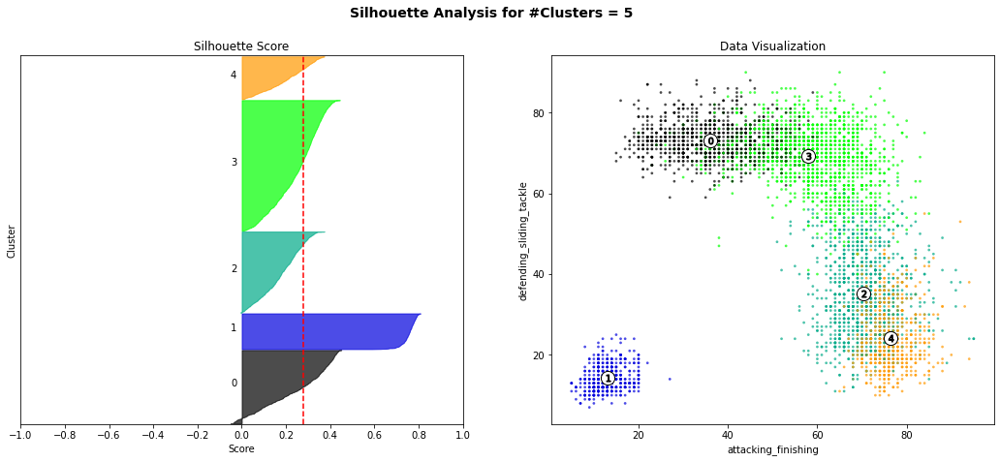

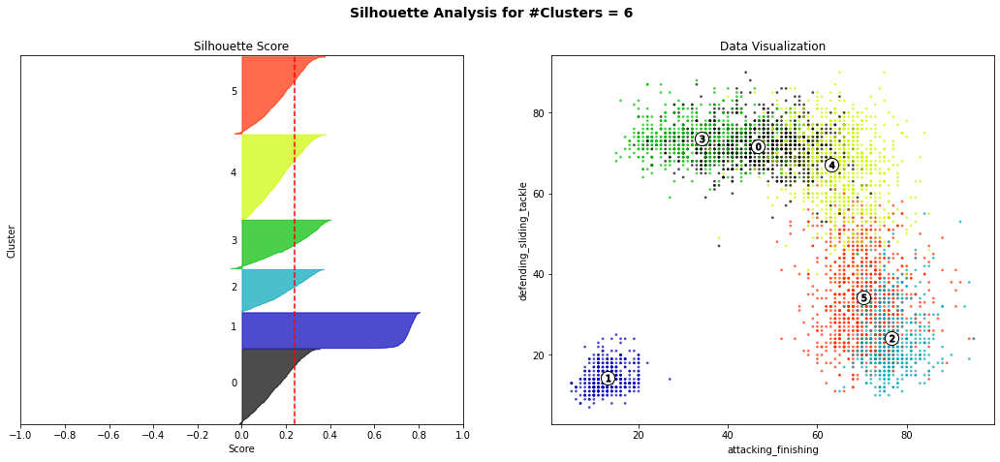

In [18]:
from utils import silhouette_analysis

range_clusters = [4, 5, 6]
silhouette_analysis(skillsDF, range_clusters, skill1, skill2)

**Observación**

Los agrupamientos analizados son los candidatos ideales según el *Método del Codo* que aplicamos previamente.
A simple vista, nuestra elección (`n_clusters = 4`) parece ser la mejor opción.

- Con `n_clusters = 4` se obtuvo el *Silhouette Score* promedio más alto, y aunque los clusters *0* y *3* poseen algunos puntos mal agrupados parecen ser pocos.
- Con `n_clusters = 5` aunque solo el cluster *0* tiene puntos mal agrupados, parece que la mayoría de las observaciones se encuentran abajo del promedio.
- Con `n_clusters = 6` se obtuvo el *Silhouette Score* promedio más bajo, además que es difícil asignar posiciones a todos los agrupamientos encontrados.

# BORRADOR
# A PARTIR DE ESTE PUNTO EN ADELANTE, ACOMODAR A LO QUE NECESITAMOS ANALIZAR!

# 4.Clustering_con_MeanShift 

- **NO** es necesario definirle la cantidad de grupos.
- **NO** es escalable, computacionalmente es muy pesado.
- Hiperparámetros: `bandwidth` (de cobertura para cálculo de media).
- Cada dato tiene un proceso iterativo en donde en una iteración considera los vecinos a menos de un radio de distancia.

In [15]:
ms = MeanShift(bandwidth=2, bin_seeding=True)
ms.fit(skillsDF)

clusters = ms.labels_

print(f'Cantidad de clusters encontrados por MeanShift: {max(clusters) + 1}')

Cantidad de clusters encontrados por MeanShift: 3


Graficamos los resultados obtenidos con el agrupamiento.

In [16]:
clustersMeanShift = go.Scatter(x=skillsDF[skill1],
                               y=skillsDF[skill2],
                               name='Players',
                               mode='markers',
                               text=bestDF.loc[:, name],
                               marker=dict(
                                   size=5,
                                   color=clusters.astype(np.float), # Set color equal to a label.
                                   colorscale='Portland',
                                   showscale=False
                               )
                              )

top = go.Scatter(x=skillsDF.loc[bool_TOP, skill1],
                 y=skillsDF.loc[bool_TOP, skill2],
                 name='Top Players',
                 text=bestDF.loc[bool_TOP, name],
                 textfont=dict(family='sans serif', size=8, color='black'),
                 opacity=0.9,
                 mode='text'
                )

data = [clustersMeanShift, top]

layout = go.Layout(title='Clustering MeanShift',
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill1),
                   yaxis=dict(title=skill2),
                   autosize=False,
                   width=950,
                   height=950
                  )

fig = go.Figure(data=data, layout=layout)
fig.show()

In [17]:
clustersDF['MeanShift'] = clusters

print(f'MeanShift encontró {max(clusters) + 1} clusters (según los hiperparámetros elegidos)')

MeanShift encontró 3 clusters (según los hiperparámetros elegidos)


**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los Clusters, usando las clases asignadas por MeanShift**

- Cantidad de observaciones por Cluster.
- Análisis descriptivo separando por Cluster.
- Tabla de contingencia alguna categórica vs Clusters.
- Silohuette

**Ahora vamos a ver que agrupamientos se pueden hacer excluyendo a los arqueros (y al resto de las posiciones ruidosas).**

# 5.Clustering_con_KMeans_sin_Arqueros

In [15]:
n = 10000

# Primeros jugadores
df_n = df.loc[:n]

# Mejores jugadores (sin arqueros)
df_n = df_n[(df_n['Position'] != 'GK') & (df_n['Overall'] > 70)]

skills_ratings = ['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing',
                  'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing',
                  'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions',
                  'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
                  'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
                  'Composure', 'Marking', 'StandingTackle', 'SlidingTackle'
                 ]

df_skills = df_n[skills_ratings]

In [16]:
# Número de clusters buscados
n_clust = 5

km = KMeans(n_clusters=n_clust)
km.fit(df_skills)

# Recuperación de etiquetas
clusters = km.labels_

print(f'Suma de los cuadrados de las distancias al cluster (Inertia) {km.inertia_}')

Suma de los cuadrados de las distancias al cluster (Inertia) 9446120.503881687


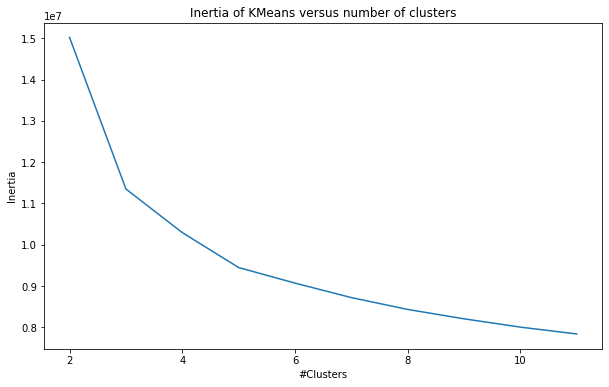

In [17]:
# Prueba para elegir el hiperparámetro 'n_clusters' variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i).fit(df_skills).inertia_ for i in range(2, 12)]

plt.figure(figsize=(10, 6))
plt.plot(np.arange(2, 12), scores)
plt.xlabel('#Clusters')
plt.ylabel('Inertia')
plt.title('Inertia of KMeans versus number of clusters');

In [18]:
bool_crack = df_n['Overall'] > 85

# Eligo dos números entre 0 y n_skills - 1
skill_1 = skills_ratings[5] # Dribbling
skill_2 = skills_ratings[15] # ShotPower

In [19]:
kmean_clusters = go.Scatter(x=df_skills[skill_1],
                            y=df_skills[skill_2],
                            mode='markers',
                            text=df_n.loc[:, 'Name'],
                            marker=dict(
                                size=5,
                                color=clusters.astype(np.float), # Set color equal to a variable
                                colorscale='Portland',
                                showscale=False
                            )
                           )

crack = go.Scatter(x=df_skills.loc[bool_crack, skill_1],
                   y=df_skills.loc[bool_crack, skill_2],
                   name='Top Players',
                   text=df_n.loc[bool_crack, 'Name'],
                   textfont=dict(family='sans serif', size=10, color='black'),
                   opacity=0.9,
                   mode='text'
                  )

data = [kmean_clusters, crack]

layout = go.Layout(title='Clustering KMeans',
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=1000
                  )

fig = go.Figure(data=data, layout=layout)
fig.show()

In [20]:
df_clusters = df_n.copy()
df_clusters['KMeans_w/o_GKs'] = clusters

print(f'KMeans encontró {max(clusters) + 1} clusters (nosotros forzamos la cantidad)')

KMeans encontró 5 clusters (nosotros forzamos la cantidad)


**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los Clusters, usando las clases asignadas por KMeans**

- Cantidad de observaciones por Cluster.
- Análisis descriptivo separando por Cluster.
- Tabla de contingencia alguna categórica vs Clusters.
- Silohuette

# 6.Clustering_con_MeanShift_sin_Arqueros

In [21]:
ms = MeanShift(bandwidth=2, bin_seeding=True)

ms.fit(df_skills)

clusters = ms.labels_

labels_unique = np.unique(clusters)
n_clusters_ = len(labels_unique)

print(f'Cantidad de clusters encontrados por MeanShift: {n_clusters_}')

Cantidad de clusters encontrados por MeanShift: 13


In [22]:
bool_crack = df_n['Overall'] > 85

# Eligo dos números entre 0 y n_skills - 1
skill_1 = skills_ratings[9] # BallControl
skill_2 = skills_ratings[10] # Acceleration

In [23]:
MeanShift_clusters = go.Scatter(x=df_skills[skill_1],
                                y=df_skills[skill_2],
                                mode='markers',
                                text=df_n.loc[:, 'Name'],
                                marker=dict(
                                    size=5,
                                    color = clusters.astype(np.float), # Set color equal to a variable
                                    colorscale='Portland',
                                    showscale=False
                                )
                               )

crack = go.Scatter(x=df_skills.loc[bool_crack, skill_1],
                   y=df_skills.loc[bool_crack, skill_2],
                   name='Top Players',
                   text=df_n.loc[bool_crack, 'Name'],
                   textfont=dict(family='sans serif', size=10, color='black'),
                   opacity=0.9,
                   mode='text'
                  )

data = [MeanShift_clusters, crack]

layout = go.Layout(title='Clustering MeanShift',
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill_1),
                   yaxis=dict(title=skill_2),
                   autosize=False,
                   width=1000,
                   height=650
                  )

fig = go.Figure(data=data, layout=layout)
fig.show()

In [24]:
df_clusters['MeanShift'] = clusters

print(f'MeanShift encontró {max(clusters) + 1} clusters (según los hiperparámetros elegidos)')

MeanShift encontró 13 clusters (según los hiperparámetros elegidos)


**EVALUACIÓN**

**EJERCICIO: Análisis exploratorio de los Clusters, usando las clases asignadas por MeanShift**

- Cantidad de observaciones por Cluster.
- Análisis descriptivo separando por Cluster.
- Tabla de contingencia alguna categórica vs Clusters.
- Silohuette

# BORRADOR

In [10]:
from sklearn.preprocessing import StandardScaler

skillsST = StandardScaler().fit_transform(skillsDF)
#pd.DataFrame(skillsST)

skillDF = pd.DataFrame(data=skillsST, columns=skillsDF.columns)

In [11]:
from sklearn import cluster, datasets


km = cluster.AgglomerativeClustering(n_clusters=4,linkage='complete', affinity='cityblock')#?ward

#km = KMeans(n_clusters=n_clust)
km.fit(skillsDF) # Utiliza todas las habilidades: 33 dimensiones.

# Recuperación de las etiquetas.
clusters = km.labels_

#print(f'Suma de los cuadrados de las distancias al cluster (Inertia) {km.inertia_}')

**Elección de la cantidad de grupos**

Una forma de seleccionar la cantidad más adecuada de *clusters* es probar varias cantidades y usar el criterio del codo, *elbow method*, utilizando una medida de ajuste que puede ser **Inertia**.

**Graficamos agrupamiento de KMedias con la cantidad de clases elegida**

Visualizamos de a dos variables por vez.

In [12]:
# Diferenciamos a los mejores jugadores.
topOverall = 85
bool_TOP = bestDF[overall] > topOverall

# Elegimos dos variables arbitrarias.
skill1 = skillRating['attacking'][1] # attacking_finishing
skill2 = skillRating['defending'][2] # defending_sliding_tackle

In [13]:
clustersKMeans = go.Scatter(x=skillsDF[skill1],
                            y=skillsDF[skill2],
                            name='Players',
                            mode='markers',
                            text=clusters,#bestDF.loc[:, name],
                            marker=dict(
                                size=5,
                                color=clusters.astype(np.float), # Set color equal to a label.
                                colorscale='Portland',
                                showscale=True
                            )
                           )

top = go.Scatter(x=skillsDF.loc[bool_TOP, skill1],
                 y=skillsDF.loc[bool_TOP, skill2],
                 name='Top Players',
                 text=bestDF.loc[bool_TOP, name],
                 textfont=dict(family='sans serif', size=8, color='black'),
                 opacity=0.9,
                 mode='text'
                )

data = [clustersKMeans, top]

layout = go.Layout(title='Clustering KMeans',
                   titlefont=dict(size=20),
                   xaxis=dict(title=skill1),
                   yaxis=dict(title=skill2),
                   autosize=False,
                   width=950,
                   height=950
                  )

fig = go.Figure(data=data, layout=layout)
fig.show()

In [14]:
clustersDF = bestDF.copy()
clustersDF['KMeans'] = clusters

print(f'KMeans encontró {max(clusters) + 1} clusters (nosotros forzamos la cantidad)')

KMeans encontró 6 clusters (nosotros forzamos la cantidad)
